**Lab 5: FIR Filtering 2**

The goal of this lab is to study the response of FIR filters to inputs such as complex exponentials and sinusoids. In the experiments of this lab, you will use `np.convolve()` to implement filters and `freqz()` to obtain the filter’s frequency response. As a result, you should learn how to characterize a filter by knowing how it reacts to different frequency components in the input.
This lab also introduces two practical filters: bandpass filters and nulling filters.
Bandpass filters can be used to detect and extract information from complex signals,
e.g., tones in a touch-tone telephone dialer. Nulling filters can be used to remove
sinusoidal interference, e.g., jamming signals in a radar.

In [1]:
import os
import numpy as np
import librosa
import IPython.display as ipd
from scipy import signal
import matplotlib.pyplot as plt
from IPython.display import Audio

from util import load_audio, plot_signals, plot_spectrogram, plot_mean_spectrogram

1.1. First, let's replicate what we did until now. Copy the functions synthesize and envelope and obtain the synthesis from the last lab.

In [ ]:
# Write your code here
import numpy as np

def envelope(x, N):
    x1= np.abs(x)   #We use absolute value
    b= [1/N]*N      # Length-N for averaging
    y= np.convolve(b,x1, mode ="same")       # We apply our filter
    return y

# Sum K harmonics with weights Ak[k] and phase scheme from the previous lab:
# y(t) = sum_k Ak[k] * cos(2π * f0 * k * t + k*phi - (k-1)*π/2)
# Then normalize to match a desired peak amplitude (A).
def synthesize(f0, phi, Ak, t,A):
  y = 0
  for k in range(len(Ak)):
    y+= Ak[k] * np.cos(2*np.pi*f0*t*k+ k*phi-(k-1)*np.pi/2)     #The formula of the previous lab
  y= A*y/np.amax((y))     #Finally, we normalize the amplitude applying the formula, previous lab
  return y

# Write the code here
weights = [1,0.2952121,0.04313676,0.0218036, 0.0259182, 0.024076,0.00309,0.04765, 0.01077,0.003986,0.00294] # We use the graph
filepath ="./audio/Harp.wav"
#filepath = "C:\\Users\\usuario\\Documents\\GitHub\\sis1_group1\\Harp.wav"
ref, fs = load_audio(filepath)    # Always capture fs from the loader to avoid hard-coding
z= envelope(ref,500)*2
A = 0.25155567                      ##It's the amplitude of the reference signal
phi = 49*np.pi/72  #previous lab
fs=44100
t = np.arange(0, 4.040272108, 1.0/fs)   #We compute by the total of the convolution
synthetizesignal= synthesize(690, phi, weights, t, A )*4

multsignal= synthetizesignal*z      #We have the multiplication

1.2 Plot both reference and synthesised signal.

In [ ]:
# Write your code here
plot_signals([ref, multsignal], fs, name=['Reference', 'Synthesised'])  #Are enough similar

---

**2. Averaging filter**

Now let's analyze the frequency response of the average filter used in the envelope function. The Scipy Python module has a function called *freqz()* for computing the frequency
response of a discrete-time LTI system. The following Python statements show how to
use freqz to compute and plot both the magnitude (absolute value) and the phase of
the frequency response of a four-point averaging system as a function of ω in the range − π ≤ ω ≤ π :

In [ ]:
from util import plot_frequency_response

ww = np.arange(-np.pi, np.pi, np.pi/500) # ω grid (rad/sample) for plotting
_, HH = signal.freqz([1/4]*4, 1, ww)

plot_frequency_response(ww, HH) # Shows magnitude/phase vs ω

For FIR filters, the second argument of `freqz(-, 1,- )` must always be equal to 1. The frequency vector ww should cover an interval of length 2π for ω , and its spacing must be fine enough to give a smooth curve for H(ejω) . Note: we will always use capital H for the frequency response.

2.1 Use the `freqz` and `plot_frequency_response` functions to plot the frequency response of the averaging filter of your envelope function.



In [ ]:
ww = np.arange(-np.pi, np.pi, np.pi/500) # Frequency grid (rad/sample)
_, HH = signal.freqz([1/500]*500, 1, ww) # 500-tap averager

plot_frequency_response(ww, HH)  # Plots |H(ω)| and ∠H(ω)

2.2 Looking at the frequency responses, what are the main differences between your filter and the four-point averaging filter. What happens when the value N is increased?

With the 4-point averager, the magnitude is spread across the band; with the long averager it strongly favors the very low (near-0) frequencies. The phase for the short filter looks smooth/linear, while the long one shows many rapid wraps. As N grows, magnitude concentrates near DC and the phase gets bumpier.

---

**3. Nulling Filters for Rejection**

Nulling filters are filters that completely eliminate some frequency components. If the frequency is $\omega=0$ or $\omega=\pi$ then a two-point FIR filter will do the nulling. The simplest possible general nulling filter can have as few as three coefficients. If $\omega_n$ is the desired nulling frequency, then the following length-3 FIR filter

$$
y[n] = x[n] - 2\cos(\omega_n)x[n-1] + x[n-2] 
$$

will have a zero in its frequency response at $\omega=\omega_n$. For example, a filter designed to completely eliminate signals of the form $e^{j0.5\pi}$ would have the following coefficients because we would pick the desired nulling frequency to be $\omega_n = 0.5\pi$

$$
b_0 = 1, \quad b1=-2cos(\omega_n)=0, \quad b_2=1
$$

3.1 Use the following function to add an interference in your reference signal. Name the corrupted signal as `x_interf`.

In [ ]:
def add_interference(x, fs): # Add a weak sinusoidal interference at 1 kHz to signal x.
  t = np.linspace(0, len(x)*1/float(fs), len(x)) # Time vector aligned with the samples in x.
  y = x + (np.amax(x)/10)*np.sin(2*np.pi*1000*t) # Interference amplitude set to 10% of x's peak to keep it noticeable but not dominant.
  return y

In [18]:
# Write your code here
corrupted= add_interference(ref,fs)

3.2 Plot both the reference signal and the corrupted signal and listen to the latter one. 

In [19]:
# Write your code here
plot_signals([ref, corrupted], fs, name=['Reference', 'Corrupted'])

In [20]:
Audio(ref, rate=fs)

In [21]:
Audio(corrupted, rate=fs)

3.3 Compare the spectrograms of the reference signal and the interference signal. 

Text(0.5, 1.0, 'Reference')

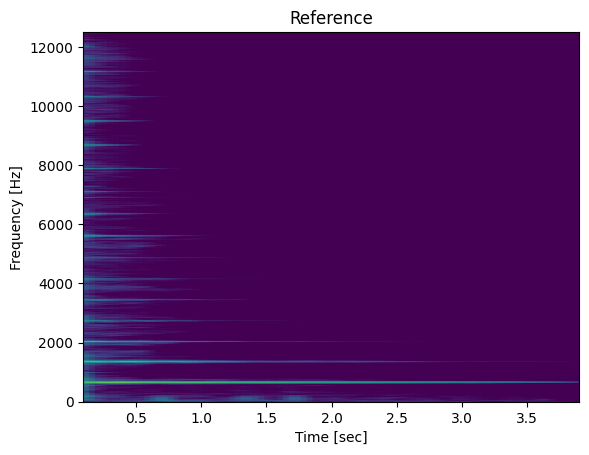

In [22]:
# Write your code here
windows_len = 8192   
ff, tt, S_ref= signal.spectrogram(ref,44100, nperseg=windows_len, noverlap=windows_len/2)   #We use the function
plot_spectrogram(ff, tt,S_ref)          #We plot it
plt.ylim([0,12500])
plt.title("Reference")

Text(0.5, 1.0, 'Corrupted')

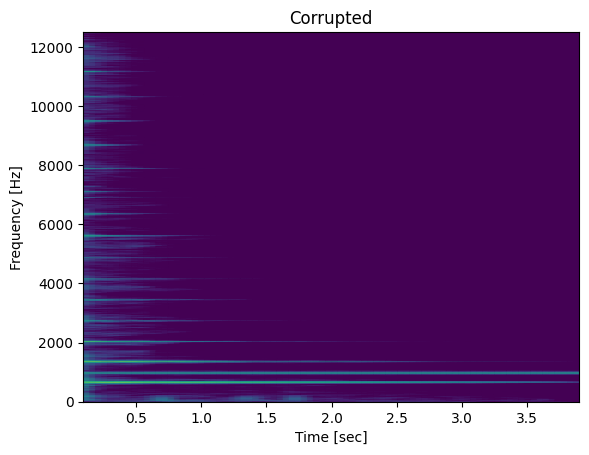

In [23]:
# Write your code here
windows_len = 8192   
ff, tt, S_ref= signal.spectrogram(corrupted,44100, nperseg=windows_len, noverlap=windows_len/2)   #We use the function
plot_spectrogram(ff, tt,S_ref)          #We plot it
plt.ylim([0,12500])
plt.title("Corrupted")

They’re essentially identical, except the corrupted signal shows a narrow line at 1 kHz—the added interference.

3.4. Create a function `remove_interference(x, fs)` that applies a nulling filter devised to remove the interference at 1000 Hz. 

Note: remember that a frequency can be converted to the normalized radian frequncy by: $\omega_n = 2\pi f_n/f_s$

In [ ]:
def remove_interference(x, fs):
  w= 1000*2*np.pi/fs        #We compute the normalized radian frequency
  y= np.convolve(x,[1,-2* np.cos(w),1], mode="same")            #we apply y[n] = x[n] - 2cos(w)x[n-1] + x[n-2] and we convolve
  return y      #w e return the clean one

3.5 Use the `remove_interference` funcion to clean the corrupted signal,  `x_interf`. Call the output as `x_clean`. Compare the spectrograms of both signals. Explain the result.

Text(0.5, 1.0, 'Reference')

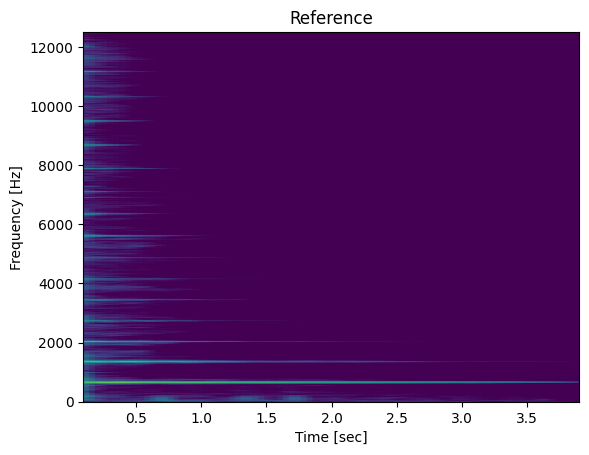

In [ ]:
# Write your code here
x_clean=remove_interference(corrupted, fs)      # Clean the corrupted signal
windows_len = 8192   
ff, tt, S_ref= signal.spectrogram(ref,44100, nperseg=windows_len, noverlap=windows_len/2)   #We use the function
plot_spectrogram(ff, tt,S_ref)          #We plot the reference spectogram
plt.ylim([0,12500])
plt.title("Reference")


Text(0.5, 1.0, 'Corrupted')

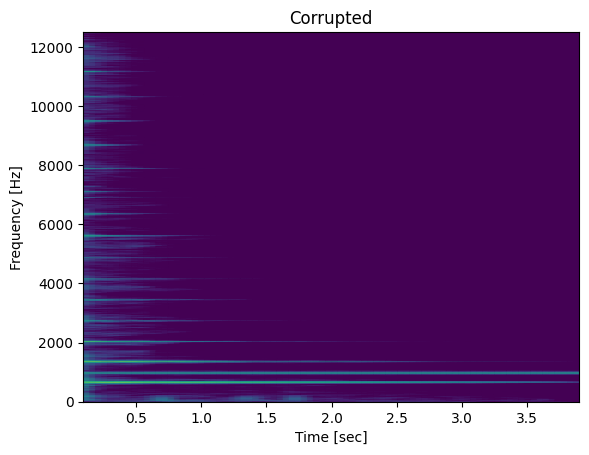

In [26]:
windows_len = 8192   
ff, tt, S_ref= signal.spectrogram(corrupted,44100, nperseg=windows_len, noverlap=windows_len/2)   #We use the function
plot_spectrogram(ff, tt,S_ref)          #We plot the corrupted spectogram
plt.ylim([0,12500])
plt.title("Corrupted")

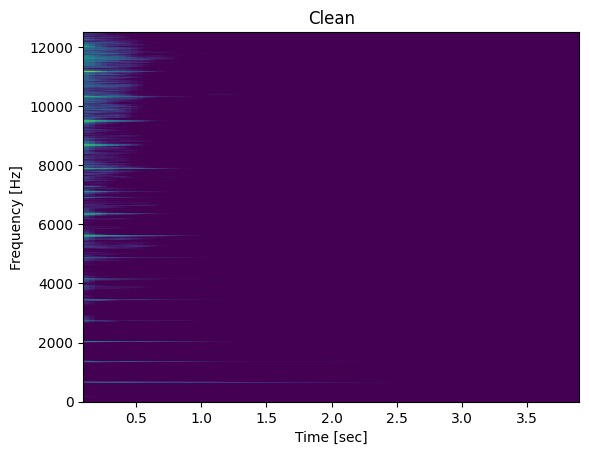

In [27]:
windows_len = 8192   
ff, tt, S_ref= signal.spectrogram( x_clean , 44100, nperseg=windows_len, noverlap=windows_len/2)   #We use the function
plot_spectrogram(ff, tt,S_ref)         #We plot the clean spectogram
plt.ylim([0,12500])
plt.title("Clean")
Audio(x_clean, rate=fs)

The cleaned spectrogram shows the 1 kHz tone is gone our notch did its job. But it also nicks nearby frequencies, so content around 1 kHz is attenuated and the signal’s character changes noticeably.